In [1]:
import os
from matplotlib import pyplot as plt
import cv2
from glob import glob

import sys
sys.path.append("..")

from src.hyperlpr import LPR, HyperLPR_plate_recognition

%load_ext autoreload
%autoreload 2

In [2]:
data_path = "../data/"

In [3]:
ls ../data/recording

screen_1.jpg   screen_15.jpg  screen_20.jpg  screen_26.jpg  screen_8.jpg
screen_10.jpg  screen_16.jpg  screen_21.jpg  screen_3.jpg   screen_9.jpg
screen_11.jpg  screen_17.jpg  screen_22.jpg  screen_4.jpg
screen_12.jpg  screen_18.jpg  screen_23.jpg  screen_5.jpg
screen_13.jpg  screen_19.jpg  screen_24.jpg  screen_6.jpg
screen_14.jpg  screen_2.jpg   screen_25.jpg  screen_7.jpg


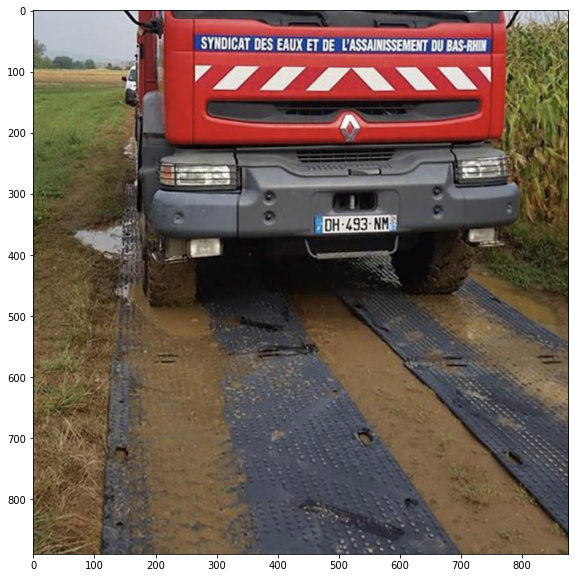

In [4]:
filename = os.path.join(data_path, "demo_1.png")
img = cv2.imread(filename)[..., ::-1]
fig = plt.figure(figsize=(10, 10))
plt.imshow(img);

In [25]:
def add_rectangle(img, y_hat, x1, y1, x2, y2):
    font_face = cv2.FONT_HERSHEY_DUPLEX
    font_scale = 3
    font_color = (255, 255, 255)
    font_thickness = 3
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    (w, h), _ = cv2.getTextSize(y_hat, font_face, font_scale, font_thickness)
    cv2.rectangle(img, (x1, y1-h), (x1+w, y1), (0, 255, 0), -1)
    font_scale *= .9
    cv2.putText(img, y_hat, (x1, y1), font_face, font_scale, font_color, font_thickness)
    return img


def add_fps(img):
    font_face = cv2.FONT_HERSHEY_DUPLEX
    font_scale = 2
    font_color = (255, 255, 255)
    font_thickness = 2
    txt = "30 FPS"
    (w, h), _ = cv2.getTextSize(txt, font_face, font_scale, font_thickness)
    cv2.rectangle(img, (0, 0), (w, h), (0, 0, 0), -1)
    font_scale *= .9
    cv2.putText(img, txt, (0, h), font_face, font_scale, font_color, font_thickness)
    return img


def show_bbox(img, results):
    img_copy = img.copy()
    for y_hat, conf, bbox in results:
        img_copy = add_rectangle(img_copy, y_hat, *bbox)
    img_copy = add_fps(img_copy)
    fig = plt.figure(figsize=(10, 10))
    plt.imshow(img_copy)

Tensor shape is (1, 3, 1080, 1920)
1087 661 1407 748
Tensor shape is (1, 3, 1080, 1920)
Tensor shape is (1, 3, 1080, 1920)
757 561 822 576
Tensor shape is (1, 3, 1080, 1920)
686 311 760 328
Tensor shape is (1, 3, 1080, 1920)
1249 657 1401 699
Tensor shape is (1, 3, 1080, 1920)
1221 652 1535 738
Tensor shape is (1, 3, 1080, 1920)
Tensor shape is (1, 3, 1080, 1920)
668 302 746 321
Tensor shape is (1, 3, 1080, 1920)
1285 669 1446 704
Tensor shape is (1, 3, 1080, 1920)
1195 551 1305 583
Tensor shape is (1, 3, 1080, 1920)
757 557 823 571
Tensor shape is (1, 3, 1080, 1920)
755 555 819 567
Tensor shape is (1, 3, 1080, 1920)
1107 655 1223 692
Tensor shape is (1, 3, 1080, 1920)
1188 584 1295 615
Tensor shape is (1, 3, 1080, 1920)
757 554 821 567
Tensor shape is (1, 3, 1080, 1920)
1036 649 1352 740
Tensor shape is (1, 3, 1080, 1920)
641 339 776 383
Tensor shape is (1, 3, 1080, 1920)
652 362 784 404
Tensor shape is (1, 3, 1080, 1920)
819 480 1025 523
Tensor shape is (1, 3, 1080, 1920)
699 466 906

/var/folders/5w/hyfqlrq101nd83437kh5nlm00000gn/T/ipykernel_51076/61358483.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10, 10))


Tensor shape is (1, 3, 1080, 1920)
1133 647 1309 690
Tensor shape is (1, 3, 1080, 1920)
641 457 848 499
Tensor shape is (1, 3, 1080, 1920)
673 350 813 395
Tensor shape is (1, 3, 1080, 1920)
646 407 783 450
Tensor shape is (1, 3, 1080, 1920)


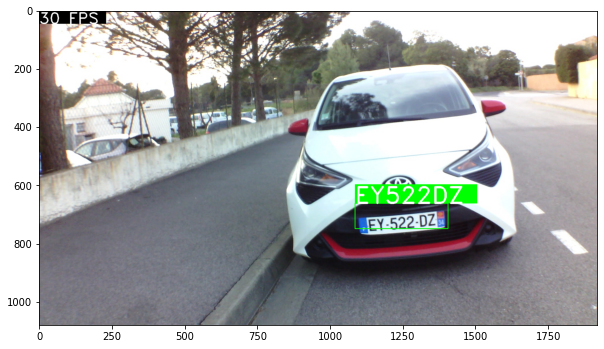

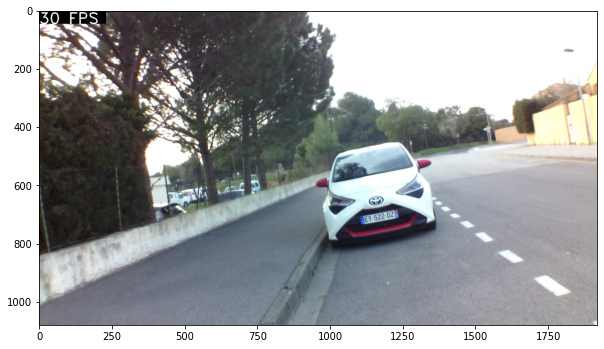

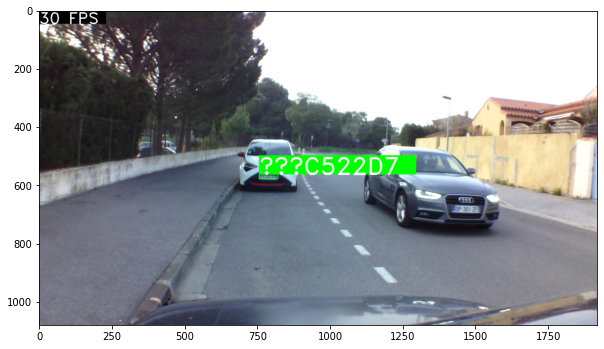

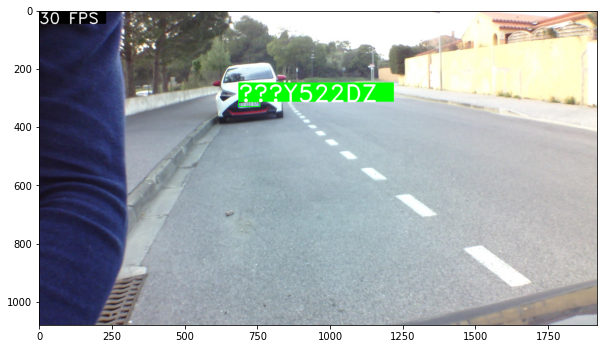

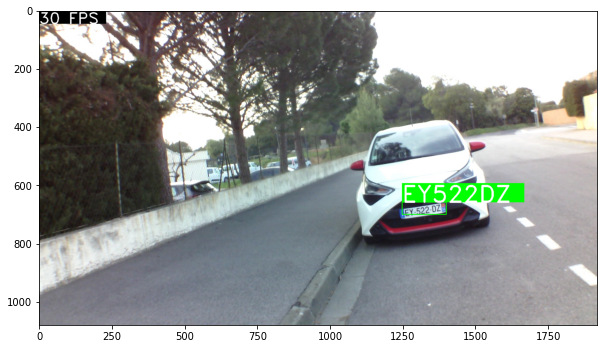

...

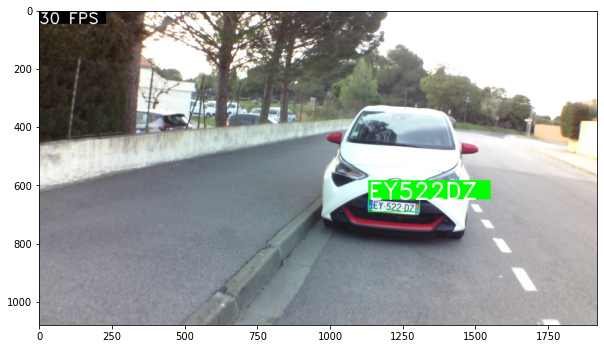

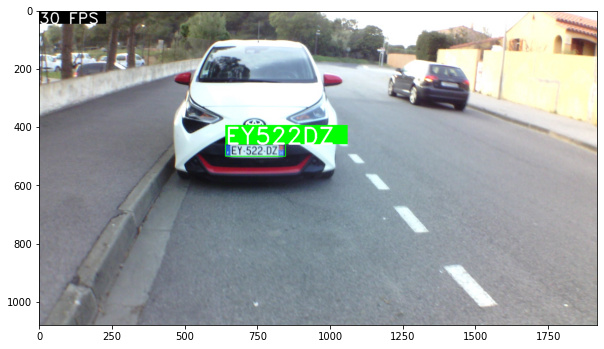

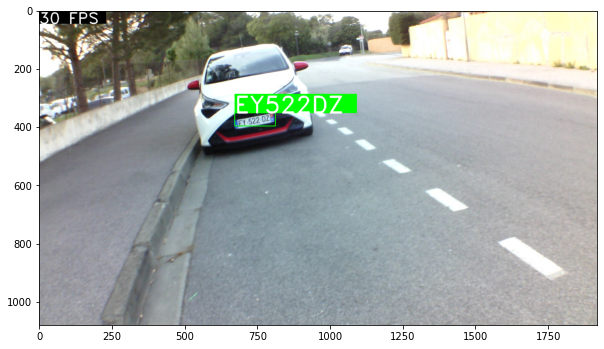

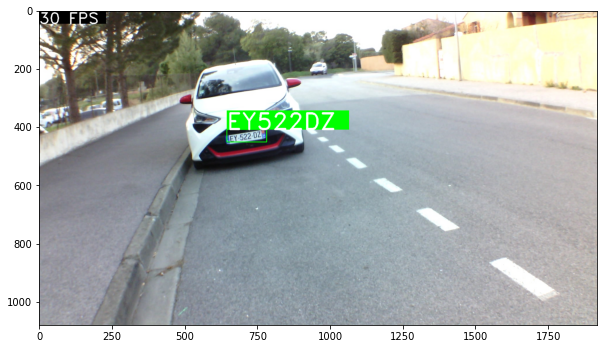

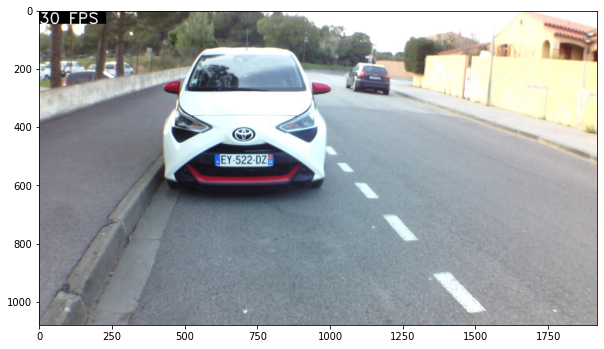

In [26]:
paths = glob(data_path+"/photo_recording/*")
for path in paths:
    img = cv2.imread(path)
    results = HyperLPR_plate_recognition(img)
    show_bbox(img[..., ::-1], results)

In [17]:
ls ../data/photo_recording

screen_1.jpg   screen_15.jpg  screen_20.jpg  screen_26.jpg  screen_8.jpg
screen_10.jpg  screen_16.jpg  screen_21.jpg  screen_3.jpg   screen_9.jpg
screen_11.jpg  screen_17.jpg  screen_22.jpg  screen_4.jpg
screen_12.jpg  screen_18.jpg  screen_23.jpg  screen_5.jpg
screen_13.jpg  screen_19.jpg  screen_24.jpg  screen_6.jpg
screen_14.jpg  screen_2.jpg   screen_25.jpg  screen_7.jpg
